In [26]:
# -*- coding: utf-8 -*-

## Import packages 


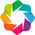

In [27]:
from __future__ import division
import string
import math
import pandas as pd 
import numpy as np
import seaborn as sns
import nltk
%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt, mpld3
import matplotlib.pylab as pylab
mpld3.enable_notebook()
import json
import unidecode
from scipy import stats
import holoviews as hv
hv.extension('bokeh')


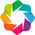

In [105]:
import pickle
import os
from nltk import sent_tokenize
from transcription_manager import evaluacion_docente_manager as edm
from text_clustering import text_preprocessing as tp, word_connection_matrix as wcm, viz

## Define paths and constants

In [29]:
# importar base de datos de audios (excel)
path_clusters = 'C:\Users\CATALINA ESPINOZA\Documents\clusters ciae'
path_data = os.path.join(path_clusters,'data')
path_db = os.path.join(path_data,'transcrip')
path_pickle = os.path.join(path_clusters,'output','pickles')

In [30]:
FILTER_STOP_WORDS = True

## Recover data

In [31]:
with open(os.path.join(path_pickle,'sessions_in_tuples.pickle'),'rb') as f:
    sessions_in_tuples = pickle.load(f)

In [38]:
all_documents_dict = dict((str(x)+'_'+str(y), z.decode('utf-8')) for x, y,z in sessions_in_tuples)

In [39]:
token_set = tp.get_all_token_set(all_documents_dict)
print(len(token_set))

7910


In [40]:
frequency_per_word = tp.get_frequency_per_word(all_documents_dict,token_set)

In [42]:
zipped = zip(token_set,frequency_per_word)
zipped.sort(key = lambda t: t[1], reverse=True)

In [94]:
list(token_set).index('hicimos')
frequency_per_word[7887]

32

In [76]:
clean_x = lambda x: str(x) if type(x) == int and type(x) == float else x.encode('utf-8')

In [79]:
# TODO: ver que hace tokenize porque no entiendo como cambia tanto el resultado de las palabras 
# mas frecuentes
print("N, Palabra, Frecuencia ")
for i in range(len(zipped)):
    if i<400:
        print str(i)+"- "+clean_x(zipped[i][0])+" - "+str(repr(zipped[i][1]).encode('utf8'))

N, Palabra, Frecuencia 
0- , - 11848
1- . - 5590
2- que - 3498
3- de - 3383
4- la - 3330
5- a - 3177
6- y - 2778
7- el - 2756
8- ? - 2464
9- en - 1729
10- es - 1590
11- ya - 1257
12- lo - 1249
13- un - 1245
14- los - 1140
15- por - 1108
16- una - 1007
17- qué - 1002
18- vamos - 975
19- se - 944
20- no - 890
21- dos - 872
22- ¿ - 847
23- .. - 828
24- con - 827
25- para - 819
26- las - 765
27- bien - 704
28- más - 630
29- ustedes - 622
30- si - 611
31- ... - 575
32- ( - 575
33- ) - 573
34- entonces - 570
35- yo - 527
36- me - 495
37- tres - 464
38- o - 459
39- ahora - 438
40- uno - 431
41- ahí - 431
42- tiene - 420
43- está - 397
44- del - 387
45- tenemos - 385
46- cuatro - 383
47- eso - 369
48- son - 364
49- van - 363
50- cierto - 359
51- al - 355
52- este - 354
53- esta - 353
54- clase - 353
55- les - 347
56- aquí - 340
57- hay - 334
58- hacer - 327
59- pero - 318
60- va - 317
61- cómo - 310
62- … - 310
63- como - 307
64- porque - 305
65- aver - 302
66- muy - 296
67- cinco - 295
68- ve

## Filter words

In [90]:
set_300_most_frequent = tp.get_filter_by_number(token_set,frequency_per_word,300,FILTER_STOP_WORDS)

In [91]:
set_300_most_frequent

[u'?',
 u'vamos',
 u'dos',
 u'bien',
 u'ustedes',
 u'si',
 u'entonces',
 u'tres',
 u'ahora',
 u'ah\xed',
 u'cuatro',
 u'van',
 u'cierto',
 u'clase',
 u'aqu\xed',
 u'hacer',
 u'va',
 u'c\xf3mo',
 u'aver',
 u'cinco',
 u'ver',
 u'menos',
 u'ac\xe1',
 u'hoy',
 u'cu\xe1nto',
 u'voy',
 u'cada',
 u'n\xfamero',
 u'seis',
 u'd\xeda',
 u'dice',
 u'igual',
 u'per\xedmetro',
 u'cuadrado',
 u'fracci\xf3n',
 u'x',
 u'ser',
 u'lados',
 u'grupo',
 u'puede',
 u'cu\xe1l',
 u'ciento',
 u'ocho',
 u'figura',
 u'despu\xe9s',
 u'fracciones',
 u'ejemplo',
 u'trabajar',
 u'mismo',
 u'\xe1rea',
 u'mil',
 u'forma',
 u'n\xfameros',
 u'qui\xe9n',
 u'decir',
 u'parte',
 u'diez',
 u'coma',
 u'problema',
 u'gu\xeda',
 u'tri\xe1ngulo',
 u'partes',
 u'tener',
 u'trabajo',
 u'cu\xe1ntos',
 u'podemos',
 u'lado',
 u'pueden',
 u'objetivo',
 u'medio',
 u'usted',
 u'pregunta',
 u'claro',
 u'doce',
 u'siete',
 u'iguales',
 u'valor',
 u'cero',
 u'primero',
 u'pesos',
 u'd\xedas',
 u'cuarenta',
 u'nueve',
 u'cent\xedmetros',
 u

### Build matrices with the pair of words frequency per session

In [95]:
matrices_list,names_matrices = wcm.get_matrices(all_documents_dict,set_300_most_frequent)
print(len(matrices_list))

710


Here is an example of one session represented as a pair of word matrix

<i>Note: Each cell represents the frequency of the relation of two words ($w_i \rightarrow w_j$). The diagonal measures the frequency of the word $w_i$</i>

In [97]:
matrix_example = pd.DataFrame(matrices_list[0])
matrix_example.columns = set_300_most_frequent
matrix_example.index = set_300_most_frequent
matrix_example

,?,vamos,dos,bien,ustedes,si,entonces,tres,ahora,ahí,...,aplicar,papel,cualquiera,atención,recuerden,porcentaje,diferentes,respecto,señorita,hicimos
?,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
vamos,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
dos,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
bien,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ustedes,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
si,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
entonces,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
tres,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ahora,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ahí,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [99]:
norm_array_list = map(lambda x: np.ravel(x),matrices_list)

### Clustering matrices

### Kmeans Clustering

(array([654.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,  56.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <a list of 10 Patch objects>)

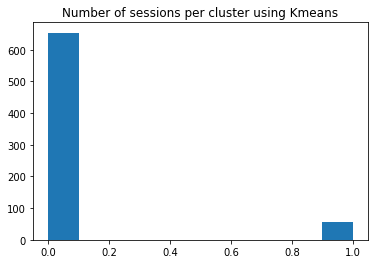

In [100]:
n_kmeans = 2
centers_kmeans,labels_kmeans = wcm.get_kmeans_clusters(norm_array_list,n_kmeans)
plt.title("Number of sessions per cluster using Kmeans")
plt.hist(labels_kmeans)

In [102]:
kmeans_axis = centers_kmeans[1] - centers_kmeans[0]
kmeans_indicator_matrices = map(lambda x: np.dot(x,kmeans_axis),norm_array_list) 

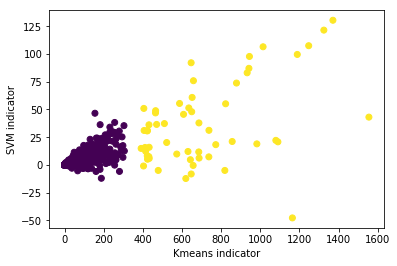

In [130]:
plt.scatter(kmeans_indicator_matrices,svm_indicator_matrices,c=labels_kmeans)
plt.ylabel("SVM indicator")
plt.xlabel("Kmeans indicator")
plt.show()

## SVM clustering

In [103]:
svm_axis = centers_svm[1] - centers_svm[0]
svm_indicator_matrices = map(lambda x: np.dot(x,svm_axis),norm_array_list)

(array([286.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0., 424.]),
 array([-1. , -0.8, -0.6, -0.4, -0.2,  0. ,  0.2,  0.4,  0.6,  0.8,  1. ]),
 <a list of 10 Patch objects>)

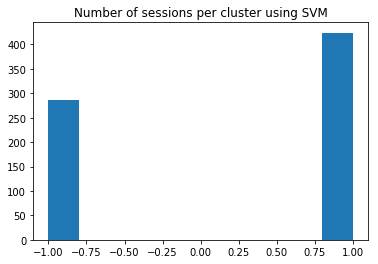

In [101]:
centers_svm,labels_svm = wcm.get_svm_clusters(norm_array_list)
plt.title("Number of sessions per cluster using SVM")
plt.hist(labels_svm)

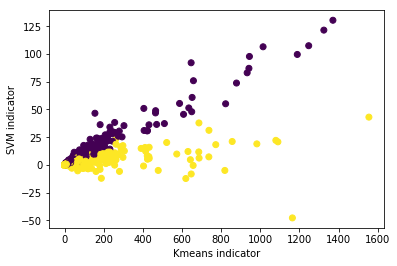

In [129]:
plt.scatter(kmeans_indicator_matrices,svm_indicator_matrices,c=labels_svm)
plt.ylabel("SVM indicator")
plt.xlabel("Kmeans indicator")
plt.show()

## Painting by time period

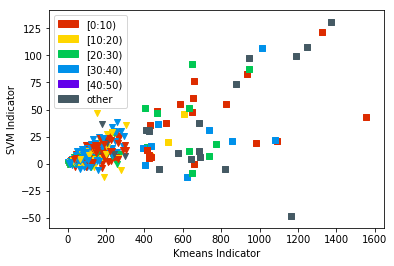

In [124]:
viz.scatter_plot_by_time_by_cluster(kmeans_indicator_matrices,svm_indicator_matrices,labels_kmeans,'Kmeans Indicator','SVM Indicator',names_matrices,'upper left')

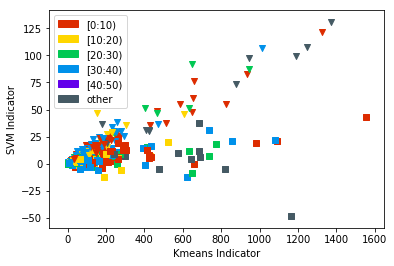

In [128]:
viz.scatter_plot_by_time_by_cluster(kmeans_indicator_matrices,svm_indicator_matrices,labels_svm,'Kmeans Indicator','SVM Indicator',names_matrices,'upper left')

In [127]:
%%opts HeatMap [tools=['hover'] colorbar=True width=1000 height=1000 toolbar='above']
ks_matrix,w_ij_cluster0,w_ij_cluster1 = viz.get_ks_matrix(labels_kmeans,norm_array_list,set_300_most_frequent)
heatmap = viz.ks_heatmap(ks_matrix,w_ij_cluster0,w_ij_cluster1,set_300_most_frequent)
heatmap

:HeatMap   [x,y]   (KS,freq_in_documents_and_by_minute_cluster_0,freq_in_documents_and_by_minute_cluster_1)